In [ ]:
# Doing the same steps as in the Homework 3

In [4]:
import sqlite3
import pandas as pd

conn = sqlite3.connect('olist.sqlite')
cursor = conn.cursor()

# List all tables in the database
tables = cursor.execute("SELECT name FROM sqlite_master WHERE type='table';").fetchall()
print("Tables in the database:", [table[0] for table in tables])

# Display schema for each table
for table in tables:
    table_name = table[0]
    schema = cursor.execute(f"PRAGMA table_info({table_name});").fetchall()
    print(f"Schema for {table_name}:")
    for col in schema:
        print(col)

# Display sample data from each table
for table in tables:
    table_name = table[0]
    df = pd.read_sql(f"SELECT * FROM {table_name} LIMIT 5;", conn)
    print(f"Sample data from {table_name}:")
    print(df)

# Query 1: Sales performance by product category
query = """
SELECT p.product_category_name, SUM(oi.price) AS total_sales, COUNT(oi.product_id) AS total_items_sold
FROM order_items oi
JOIN products p ON oi.product_id = p.product_id
GROUP BY p.product_category_name
ORDER BY total_sales DESC;
"""
sales_performance = pd.read_sql(query, conn)
print(sales_performance)

# Query 2: Average delivery delay
query = """
SELECT
    AVG(julianday(o.order_delivered_customer_date) - julianday(o.order_estimated_delivery_date)) AS avg_delivery_delay,
    COUNT(o.order_id) AS total_delivered_orders
FROM orders o
WHERE o.order_delivered_customer_date IS NOT NULL;
"""
delivery_performance = pd.read_sql(query, conn)
print(delivery_performance)

# Query 3: Top customers by total orders
query = """
SELECT c.customer_unique_id, COUNT(o.order_id) AS total_orders
FROM customers c
JOIN orders o ON c.customer_id = o.customer_id
GROUP BY c.customer_unique_id
ORDER BY total_orders DESC
LIMIT 10;
"""
customer_segmentation = pd.read_sql(query, conn)
print(customer_segmentation)

# Query 4: Monthly revenue
query = """
SELECT strftime('%Y-%m', o.order_purchase_timestamp) AS month, SUM(oi.price) AS total_revenue
FROM orders o
JOIN order_items oi ON o.order_id = oi.order_id
GROUP BY month
ORDER BY month;
"""
revenue_by_month = pd.read_sql(query, conn)
print(revenue_by_month)

# Query 5: Price vs freight value analysis
query = """
SELECT oi.price, oi.freight_value
FROM order_items oi
WHERE oi.freight_value IS NOT NULL
LIMIT 1000;
"""
freight_analysis = pd.read_sql(query, conn)
print(freight_analysis)

# Close the database connection
conn.close()


Tables in the database: ['product_category_name_translation', 'sellers', 'customers', 'geolocation', 'order_items', 'order_payments', 'order_reviews', 'orders', 'products', 'leads_qualified', 'leads_closed']
Schema for product_category_name_translation:
(0, 'product_category_name', 'TEXT', 0, None, 0)
(1, 'product_category_name_english', 'TEXT', 0, None, 0)
Schema for sellers:
(0, 'seller_id', 'TEXT', 0, None, 0)
(1, 'seller_zip_code_prefix', 'INTEGER', 0, None, 0)
(2, 'seller_city', 'TEXT', 0, None, 0)
(3, 'seller_state', 'TEXT', 0, None, 0)
Schema for customers:
(0, 'customer_id', 'TEXT', 0, None, 0)
(1, 'customer_unique_id', 'TEXT', 0, None, 0)
(2, 'customer_zip_code_prefix', 'INTEGER', 0, None, 0)
(3, 'customer_city', 'TEXT', 0, None, 0)
(4, 'customer_state', 'TEXT', 0, None, 0)
Schema for geolocation:
(0, 'geolocation_zip_code_prefix', 'INTEGER', 0, None, 0)
(1, 'geolocation_lat', 'REAL', 0, None, 0)
(2, 'geolocation_lng', 'REAL', 0, None, 0)
(3, 'geolocation_city', 'TEXT', 0, Non

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import numpy as np

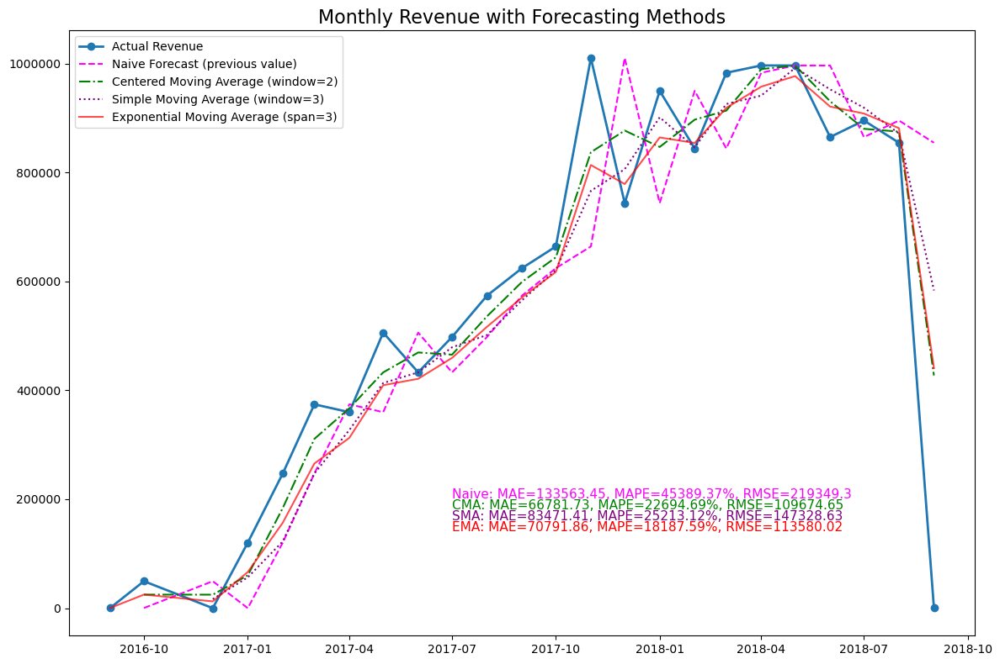

In [32]:
# Visualization 1: Matplotlib Bar Chart
# Ensure the revenue_by_month DataFrame is sorted by date
revenue_by_month['month'] = pd.to_datetime(revenue_by_month['month'])
revenue_by_month = revenue_by_month.sort_values(by='month')

# Create forecasts
revenue_by_month['naive_forecast'] = revenue_by_month['total_revenue'].shift(1)
revenue_by_month['cma'] = revenue_by_month['total_revenue'].rolling(window=2, center=True).mean()
revenue_by_month['sma'] = revenue_by_month['total_revenue'].rolling(window=3).mean()
revenue_by_month['ema'] = revenue_by_month['total_revenue'].ewm(span=3, adjust=False).mean()

# Calculate error metrics for each method
def calculate_errors(actual, forecast):
    mae = np.round(np.mean(np.abs(actual - forecast)), 2)
    mape = np.round(np.mean(np.abs((actual - forecast) / actual)) * 100, 2)
    rmse = np.round(np.sqrt(np.mean((actual - forecast) ** 2)), 2)
    return mae, mape, rmse

actual = revenue_by_month['total_revenue'][1:]  # Exclude the first value
naive_forecast = revenue_by_month['naive_forecast'][1:]
cma = revenue_by_month['cma'][1:]
sma = revenue_by_month['sma'][1:]
ema = revenue_by_month['ema'][1:]

naive_errors = calculate_errors(actual, naive_forecast)
cma_errors = calculate_errors(actual, cma)
sma_errors = calculate_errors(actual, sma)
ema_errors = calculate_errors(actual, ema)

# Plot the time series with forecasts
plt.figure(figsize=(12, 8))
plt.plot(revenue_by_month['month'], revenue_by_month['total_revenue'], label='Actual Revenue', marker='o', linewidth=2)
plt.plot(revenue_by_month['month'], revenue_by_month['naive_forecast'], label='Naive Forecast', linestyle='--', color='magenta')
plt.plot(revenue_by_month['month'], revenue_by_month['cma'], label='Centered Moving Average (CMA)', linestyle='-.', color='green')
plt.plot(revenue_by_month['month'], revenue_by_month['sma'], label='Simple Moving Average (SMA)', linestyle=':', color='purple')
plt.plot(revenue_by_month['month'], revenue_by_month['ema'], label='Exponential Moving Average (EMA)', linestyle='-', color='red', alpha=0.7)

# Annotate error metrics
annotation_fontsize = 11  

error_text_naive = f"Naive: MAE={naive_errors[0]}, MAPE={naive_errors[1]}%, RMSE={naive_errors[2]}"
error_text_cma = f"CMA: MAE={cma_errors[0]}, MAPE={cma_errors[1]}%, RMSE={cma_errors[2]}"
error_text_sma = f"SMA: MAE={sma_errors[0]}, MAPE={sma_errors[1]}%, RMSE={sma_errors[2]}"
error_text_ema = f"EMA: MAE={ema_errors[0]}, MAPE={ema_errors[1]}%, RMSE={ema_errors[2]}"

# Display error metrics dynamically on the plot at adjusted positions
x_pos = revenue_by_month['month'].iloc[int(len(revenue_by_month) * 0.4)]  
y_pos = max(revenue_by_month['total_revenue']) * 0.2  

plt.text(x_pos, y_pos, error_text_naive, fontsize=annotation_fontsize, color='magenta')
plt.text(x_pos, y_pos * 0.9, error_text_cma, fontsize=annotation_fontsize, color='green')
plt.text(x_pos, y_pos * 0.8, error_text_sma, fontsize=annotation_fontsize, color='purple')
plt.text(x_pos, y_pos * 0.7, error_text_ema, fontsize=annotation_fontsize, color='red')

# Formatting the plot
plt.title('Monthly Revenue with Forecasting Methods', fontsize=16)

# Update the legend to include parameters for forecasting methods
plt.legend([
    'Actual Revenue',
    'Naive Forecast (previous value)',
    'Centered Moving Average (window=2)',
    'Simple Moving Average (window=3)',
    'Exponential Moving Average (span=3)'
], loc='upper left')


# Avoid scientific notation on the y-axis
plt.ticklabel_format(style='plain', axis='y')
plt.tight_layout()

# Remove axis labels
plt.xlabel("")
plt.ylabel("")

# Remove grid
plt.grid(False)

plt.show()

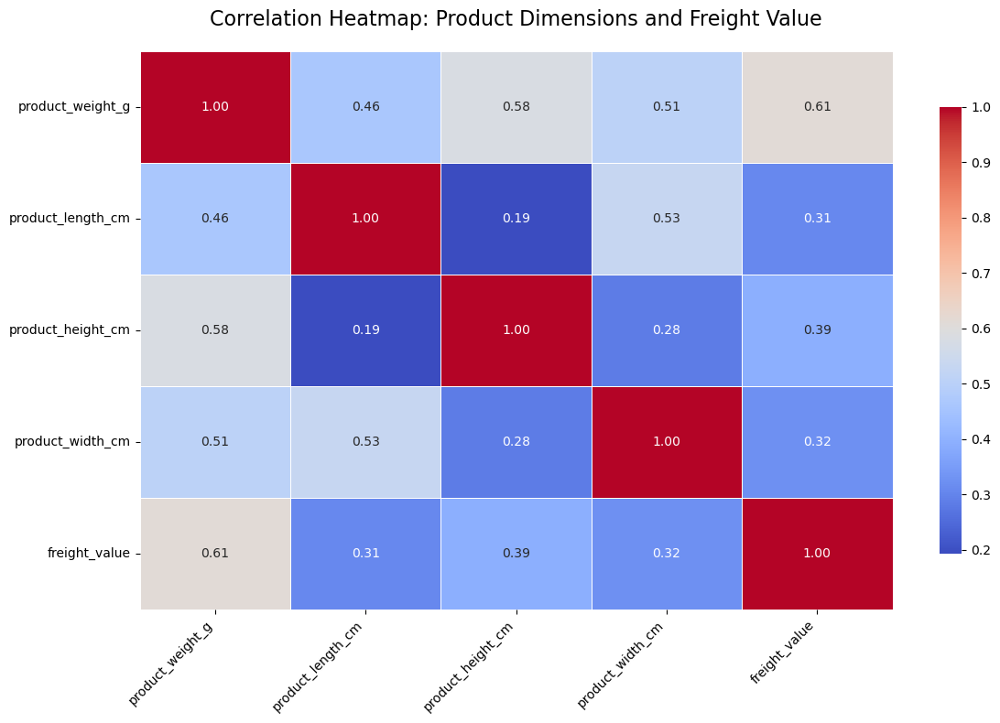

In [38]:
# Reopen the database connection
conn = sqlite3.connect('olist.sqlite')

# Load numerical data
numerical_query = """
SELECT 
    product_weight_g, 
    product_length_cm, 
    product_height_cm, 
    product_width_cm, 
    freight_value
FROM order_items
JOIN products ON order_items.product_id = products.product_id
"""
numerical_df = pd.read_sql_query(numerical_query, conn)

# Calculate the correlation matrix
correlation_matrix = numerical_df.corr()

# Plot the heatmap with enhancements
plt.figure(figsize=(12, 8))
heatmap = sns.heatmap(
    correlation_matrix, 
    annot=True, 
    fmt='.2f', 
    cmap='coolwarm', 
    linewidths=0.5, 
    cbar_kws={'shrink': 0.8}
)

# Customizations
heatmap.set_title('Correlation Heatmap: Product Dimensions and Freight Value', fontsize=16, pad=20)
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=10)
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0, fontsize=10)

# Remove axis labels
heatmap.set_xlabel('')
heatmap.set_ylabel('')

# Remove legend title
colorbar = heatmap.collections[0].colorbar
colorbar.ax.set_title('')

# Highlight stronger correlations
for i in range(correlation_matrix.shape[0]):
    for j in range(correlation_matrix.shape[1]):
        value = correlation_matrix.iloc[i, j]
        if abs(value) > 0.7 and i != j:  # Only highlight strong correlations (excluding diagonal)
            heatmap.text(
                j + 0.5, i + 0.5, f'⭐', 
                ha='center', va='center', color='black', fontsize=12
            )

plt.tight_layout()
plt.show()

In [55]:
import sqlite3
import pandas as pd
import plotly.express as px
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Reopen the database connection
conn = sqlite3.connect('olist.sqlite')

# Query to get review scores, payment values, and freight values
reviews_query = """
SELECT 
    review_score, 
    payment_value,
    freight_value
FROM order_reviews
JOIN orders ON order_reviews.order_id = orders.order_id
JOIN order_payments ON orders.order_id = order_payments.order_id
JOIN order_items ON orders.order_id = order_items.order_id
"""
reviews_df = pd.read_sql_query(reviews_query, conn)

# Preprocessing: Standardize the data for clustering
scaler = StandardScaler()
scaled_features = scaler.fit_transform(reviews_df[['review_score', 'freight_value']])

# Clustering with K-Means
kmeans = KMeans(n_clusters=5, random_state=42)  # Five clusters for review scores and freight values
reviews_df['cluster'] = kmeans.fit_predict(scaled_features)

# Map clusters to meaningful descriptions
cluster_descriptions = {
    0: '1: Low Reviews',
    1: '2: Moderate Reviews',
    2: '3: Neutral Reviews',
    3: '4: Positive Reviews',
    4: '5: High Reviews'
}
reviews_df['cluster_description'] = reviews_df['cluster'].map(cluster_descriptions)

# Define unique colors for each cluster
cluster_colors = {
    0: 'red',
    1: 'orange',
    2: 'green',
    3: 'blue',
    4: 'purple'
}

# Create separate plots for each cluster with marginal density plots
for cluster_id, description in cluster_descriptions.items():
    cluster_df = reviews_df[reviews_df['cluster'] == cluster_id]
    
    fig = px.scatter(
        cluster_df,
        x='payment_value',
        y='freight_value',
        title=f'{description}',
        labels={
            'payment_value': 'Payment Value',
            'freight_value': 'Freight Value'
        },
        opacity=0.7,
        marginal_x='violin',  # Density plot along x-axis
        marginal_y='violin',  # Density plot along y-axis
    )
    
    # Set the color for the scatter points
    fig.update_traces(marker=dict(color=cluster_colors[cluster_id]))
    
    # Update layout for aesthetics
    fig.update_layout(
        title_font_size=18,
        xaxis_title='Payment Value',
        yaxis_title='Freight Value',
    )
    
    # Show each plot
    fig.show()

/Users/albertsimonyan/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

